

# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> Data Science 2: Advanced Topics in Data Science 
## Homework 7 - Generative Models - Autoencoders and GANs 



**Harvard University**<br/>
**Spring 2019**<br/>
**Instructors**: Pavlos Protopapas and Mark Glickman 


<hr style="height:2pt">

### INSTRUCTIONS

- This is individual homework - No collaboration/Groups
- To submit your assignment follow the instructions given in canvas.
- Restart the kernel and run the whole notebook again before you submit (excluding large networks)
- Please note that the model training in this assignment can take a long time (even on a GPU). Expect to train for more than 2-3hrs per model.

<hr style="height:2pt">

In [1]:
#PLEASE RUN THIS CELL 
import requests
from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

In [2]:
#PLEASE RUN THIS CELL 
import requests
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from skimage.io import imread
from scipy.misc import imresize
from sklearn.model_selection import train_test_split


from keras.models import Sequential, Model, load_model
from keras.layers import Dropout, Flatten, Dense, Conv2D, MaxPooling2D, Input, Reshape, UpSampling2D, InputLayer, Lambda, ZeroPadding2D, Cropping2D, Conv2DTranspose, BatchNormalization
from keras.utils import np_utils, to_categorical
from keras.losses import binary_crossentropy
from keras import backend as K,objectives
from keras.losses import mse, binary_crossentropy
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam, RMSprop
from keras.initializers import RandomNormal
import random


from IPython.core.display import HTML
styles = requests.get("https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

Using TensorFlow backend.


In [3]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()
import tensorflow as tf
with tf.device('/gpu:0'):
    a = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[2, 3], name='a')
    b = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[3, 2], name='b')
    c = tf.matmul(a, b)

with tf.Session() as sess:
    print (sess.run(c))

[[22. 28.]
 [49. 64.]]


In [4]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.layers import Layer
import keras

In [5]:
import cv2

## Question 1: Making Faces [97 pts]  </b></div>

We'll be using a subset of the Celeb A dataset to help us build facial generative models, as described on the [Celeb A](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) website. CelebFaces Attributes Dataset (CelebA) is a large-scale face attributes dataset with more than 200K celebrity images, each with 40 attribute annotations. The images in this dataset cover large pose variations and background clutter. 

CelebA has large diversities, large quantities, and rich annotations, including

- 10,177 number of identities,
- 202,599 number of face images, 
- 5 landmark locations, and 
- 40 binary attributes annotations per image.

### Part A:  Preparing the Data [10 pts]

**1.A.1.** Download the dataset from: [CelebA Dataset](https://s3.amazonaws.com/gec-harvard-dl2-hw2-data/datasets/celeba-dataset.zip). In the provided data you'll see the `img_align_celeba` directory. The images in that directory will form your dataset.  You may want to create a [Keras Custom Data Generator](https://techblog.appnexus.com/a-keras-multithreaded-dataframe-generator-for-millions-of-image-files-84d3027f6f43).  

**1.A.2.** Load the attribute data in `list_attr_celeba.csv` into a pandas dataframe.

**1.A.3.** Pick 3 random images from the dataset, plot them, and verify that the attributes are accurate.

# Solutions

In [6]:
list_attr_celebs = pd.read_csv('data/list_attr_celeba.csv')

In [7]:
display(list_attr_celebs.head())

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [8]:
# data directory
DATA_DIR = 'data/img_align_celeba'

In [9]:
# number of images
print(list_attr_celebs.shape[0])

202599


In [10]:
# grab image IDs
# and split into train and val
list_IDs = list_attr_celebs.image_id.values
list_IDs_train, list_IDs_val = train_test_split(list_IDs, test_size=0.1)

In [11]:
# number of iamge to show
n_images = 3

# set seed
np.random.seed(1234)

# grab the image paths
rand_images = np.random.choice(list_attr_celebs.image_id.values, replace=False, size=n_images)

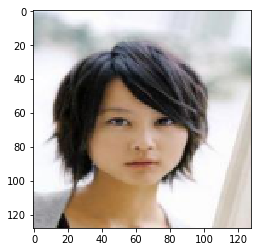

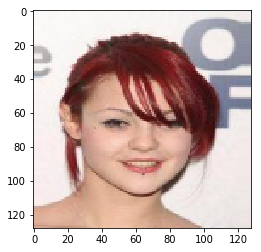

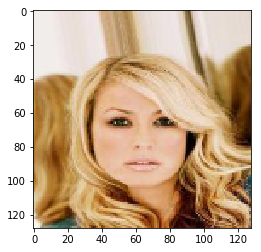

In [13]:
# loop
# - create full path to image
# - load image
# - plot image
for img_file in rand_images:
    fig, ax = plt.subplots(1,1, figsize=(4,4))
    img_path = os.path.join(DATA_DIR, img_file)
    img = load_img(img_path)
    img_r = cv2.resize(img_to_array(img),(128,128))/255
    ax.imshow(img_r)

In [14]:
# grab global vars
DIMS = cv2.resize(img_to_array(load_img(os.path.join(DATA_DIR, list_attr_celebs.iloc[0,0]))), (128,128)).shape
DIM = DIMS[:-1]
NCHAN = DIMS[-1]
print('Image dimensions:', DIM)
print('Number of channels:', NCHAN)

Image dimensions: (128, 128)
Number of channels: 3


In [15]:
# data generator class 
# -- adpated from Shervine Amidi
# -- his page: https://stanford.edu/~shervine/
class DataGenerator(keras.utils.Sequence):
    
    # initialization
    def __init__(self, list_IDs, batch_size=8, dim=(64,64), n_channels=3, shuffle=True):
        self.dim = dim
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.on_epoch_end()

    # characterize number of batches per epoch
    def __len__(self):
        return(int(np.floor(len(self.list_IDs) / self.batch_size)))

    # grab batch of data
    def __getitem__(self, index):
        # grab appropriate index
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # grab IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # generate data
        X = self.__data_generation(list_IDs_temp)
        
        return(X, None)

    # shuffle data
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    # generate data
    def __data_generation(self, list_IDs_temp):

        # init
        X = np.empty((self.batch_size, *self.dim, self.n_channels))

        # generate data
        for i, ID in enumerate(list_IDs_temp):
            # store sample
            img = load_img(os.path.join(DATA_DIR, ID))
            X[i,] = cv2.resize(img_to_array(img), self.dim)/255
            if X.shape[1:] != DIMS:
                print('error')

        return(X)

### Part B: Building and Training a Variational Autoencoder Model [44 pts]

**1.B.1.** Create and compile a Convolutional Variational Autoencoder Model (including encoder and decoder) for the celebrity faces dataset.  Print summaries for the encoder, decoder and full autoencoder models.

**1.B.2.** Train your model on the images in the celebA dataset.

**1.B.3.** Choose a random input image.  Encode the image and then Decode the latent representation.  Plot the original image and the reconstructed output.  How do they compare?

**1.B.4.** Choose two celebrity faces from the dataset that differ according to two attributes and taking advantages of alterations of the latent representations image morph from one to the other.  See below for an example.

![](latent_1.png)

**1.B.5.** Generate and visualise around 15 celebrity faces not in your training set.  How do the generated faces compare in quality to celebrity faces from the training samples?

# Solutions

**1.B.1.** Create and compile a Convolutional Variational Autoencoder Model (including encoder and decoder) for the celebrity faces dataset.  Print summaries for the encoder, decoder and full autoencoder models.

**1.B.2.** Train your model on the images in the celebA dataset.

In [16]:
# global vars
LATENT_DIMS = 6 # 4 not working
BATCH_SIZE = 8 # OOM error for anything >8

In [17]:
# define generators 
training_generator = DataGenerator(list_IDs=list_IDs_train, batch_size=BATCH_SIZE,
                                   dim=DIM, n_channels=NCHAN)
validation_generator = DataGenerator(list_IDs=list_IDs_val, batch_size=BATCH_SIZE,
                                     dim=DIM, n_channels=NCHAN)

In [26]:
### Define Encoder

# input 
input_img = Input(shape=DIMS)

# convolution and pooling architecture
enc = Conv2D(filters=32, strides=1, kernel_size=3, padding='same', activation='relu', 
            kernel_initializer='random_uniform')(input_img)
enc = MaxPooling2D(2)(enc)
enc = BatchNormalization(momentum=0.8)(enc)

enc = Conv2D(filters=32, strides=1, kernel_size=3, padding='same', activation='relu', 
            kernel_initializer='random_uniform')(enc)
enc = MaxPooling2D(2)(enc)
enc = BatchNormalization(momentum=0.8)(enc)

enc = Conv2D(filters=32, strides=1, kernel_size=3, padding='same', activation='relu',
            kernel_initializer='random_uniform')(enc)
enc = MaxPooling2D(2)(enc)
enc = BatchNormalization(momentum=0.8)(enc)

enc = Conv2D(filters=32, strides=1, kernel_size=3, padding='same', activation='relu',
            kernel_initializer='random_uniform')(enc)
enc = MaxPooling2D(2)(enc)
enc = BatchNormalization(momentum=0.8)(enc)

# store shape of the network for decoder
shape_before_flattening = K.int_shape(enc)

# flatten to dense
enc = Flatten()(enc)

# dense architecture
enc = Dense(units=128, activation='relu', kernel_initializer='random_uniform')(enc)
enc = Dense(units=32, activation='relu', kernel_initializer='random_uniform')(enc)
enc = Dense(units=LATENT_DIMS, activation='relu', kernel_initializer='random_uniform')(enc)

# latent representation
# grab latent mean and (log)variance
z_mu = Dense(LATENT_DIMS)(enc)
z_log_sigma = Dense(LATENT_DIMS)(enc)

In [27]:
### sampling function
def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = K.random_normal(shape=K.shape(z_mu),
                              mean=0., stddev=1.)
    return(z_mu + K.exp(z_log_sigma) * epsilon)

# sample vector from the latent distribution
z = Lambda(sampling)([z_mu, z_log_sigma])

In [28]:
# encoder summary
encoder = Model(input_img, z)
encoder.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 128, 128, 32) 896         input_3[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_3 (MaxPooling2D)  (None, 64, 64, 32)   0           conv2d_5[0][0]                   
__________________________________________________________________________________________________
batch_normalization_9 (BatchNor (None, 64, 64, 32)   128         max_pooling2d_3[0][0]            
__________________________________________________________________________________________________
conv2d_6 (

In [31]:
### Define Decoder

# decoder takes the latent distribution sample as input
decoder_input = Input(K.int_shape(z)[1:])

# expand from latent dimension to flatten dims
# dense architecture
dec = Dense(units=32, activation='relu', kernel_initializer='random_uniform')(decoder_input)
dec = Dense(units=64, activation='relu', kernel_initializer='random_uniform')(dec)
dec = Dense(units=np.prod(shape_before_flattening[1:]), activation='relu', kernel_initializer='random_uniform')(dec)

# reshape (reverse flatten)
dec = Reshape(shape_before_flattening[1:], name='reshape')(dec)

# reverse encoder
# deconvolution and upsampling achitecture
dec = BatchNormalization(momentum=0.8)(dec)
dec = UpSampling2D(2)(dec)
dec = Conv2DTranspose(filters=32, kernel_size=3, strides=1, padding='same', activation='relu',
            kernel_initializer='random_uniform')(dec)

dec = BatchNormalization(momentum=0.8)(dec)
dec = UpSampling2D(2)(dec)
dec = Conv2DTranspose(filters=32, kernel_size=3, strides=1, padding='same', activation='relu',
            kernel_initializer='random_uniform')(dec)

dec = BatchNormalization(momentum=0.8)(dec)
dec = UpSampling2D(2)(dec)
dec = Conv2DTranspose(filters=32, kernel_size=3, strides=1, padding='same', activation='relu',
            kernel_initializer='random_uniform')(dec)

dec = BatchNormalization(momentum=0.8)(dec)
dec = UpSampling2D(2)(dec)
dec = Conv2DTranspose(filters=NCHAN, kernel_size=4, strides=1, padding='same', activation='sigmoid',
            kernel_initializer='random_uniform')(dec)

# decoder model statement
decoder = Model(decoder_input, dec)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)

In [32]:
# decoder summary
decoder.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 6)                 0         
_________________________________________________________________
dense_17 (Dense)             (None, 32)                224       
_________________________________________________________________
dense_18 (Dense)             (None, 64)                2112      
_________________________________________________________________
dense_19 (Dense)             (None, 2048)              133120    
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 32)          0         
_________________________________________________________________
batch_normalization_17 (Batc (None, 8, 8, 32)          128       
_________________________________________________________________
up_sampling2d_5 (UpSampling2 (None, 16, 16, 32)        0         
__________

In [33]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(Layer):

    def vae_loss(self, x, z_decoded):
        
        # reconstruction error
        mse_loss = K.mean(K.square(x-z_decoded))

        # KL divergence
        kl_loss = K.mean(-5e-3 * K.mean(1 + z_log_sigma - K.square(z_mu) - K.exp(z_log_sigma), axis=-1))
        return(mse_loss + kl_loss)

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])

In [34]:
# VAE model statement
vae = Model(input_img, y)
vae.compile(optimizer='adam', loss=None)

In [35]:
vae.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 128, 128, 32) 896         input_3[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_3 (MaxPooling2D)  (None, 64, 64, 32)   0           conv2d_5[0][0]                   
__________________________________________________________________________________________________
batch_normalization_9 (BatchNor (None, 64, 64, 32)   128         max_pooling2d_3[0][0]            
__________________________________________________________________________________________________
conv2d_6 (

In [36]:
# fit and train model
vae.fit_generator(generator=training_generator,
                  validation_data=validation_generator,
                  epochs=7, 
                 verbose=True)

Epoch 1/7
22792/22792 [==============================] - 672s 29ms/step - loss: 0.0522 - val_loss: 0.0488
Epoch 2/7
22792/22792 [==============================] - 664s 29ms/step - loss: 0.0500 - val_loss: 0.0496
Epoch 3/7
22792/22792 [==============================] - 666s 29ms/step - loss: 0.0493 - val_loss: 0.0476
Epoch 4/7
22792/22792 [==============================] - 666s 29ms/step - loss: 0.0495 - val_loss: 0.0488
Epoch 5/7
22792/22792 [==============================] - 664s 29ms/step - loss: 0.0497 - val_loss: 0.0486
Epoch 6/7
22792/22792 [==============================] - 666s 29ms/step - loss: 0.0493 - val_loss: 0.0479
Epoch 7/7
22792/22792 [==============================] - 665s 29ms/step - loss: 0.0490 - val_loss: 0.0495


In [37]:
# save model
vae.save('vae___1')

**1.B.3.** Choose a random input image.  Encode the image and then Decode the latent representation.  Plot the original image and the reconstructed output.  How do they compare?

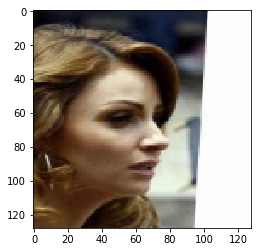

In [99]:
# plot random image
np.random.seed(3087580)
img_file = os.path.join(DATA_DIR, np.random.choice(list_IDs))
img_ = load_img(img_file)
img = cv2.resize(img_to_array(img_), DIM)/255
fig, ax = plt.subplots(1,1, figsize=(4,4))
ax.imshow(img);
img1 = img

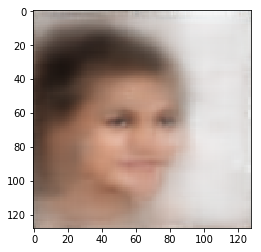

In [100]:
### encode and decode image

# encoder 
en_m = Model(input_img, z_mu)
en_v = Model(input_img, z_log_sigma)
m = en_m.predict(img.reshape((1,)+DIMS))
v = en_v.predict(img.reshape((1,)+DIMS))

# prediction
zpred = np.zeros((1,6))
for i in (range(6)):
    zpred[0,i] = np.random.normal(loc=m[0][i], scale=np.exp(v[0][i]))
zpred1 = zpred
pred = decoder.predict(zpred)
plt.imshow(pred.reshape(DIMS))

**1.B.4.** Choose two celebrity faces from the dataset that differ according to two attributes and taking advantages of alterations of the latent representations image morph from one to the other.  See below for an example.

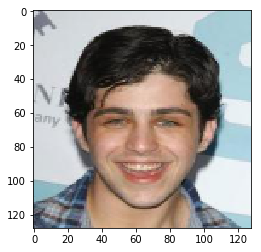

In [101]:
# plot random image # 2
np.random.seed(133059836)
img_file = os.path.join(DATA_DIR, np.random.choice(list_IDs))
img_ = load_img(img_file)
img = cv2.resize(img_to_array(img_), DIM)/255
fig, ax = plt.subplots(1,1, figsize=(4,4))
ax.imshow(img);
img2 = img

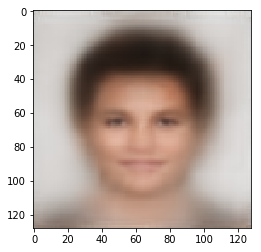

In [102]:
### encode and decode image

# encoder 
en_m = Model(input_img, z_mu)
en_v = Model(input_img, z_log_sigma)
m = en_m.predict(img.reshape((1,)+DIMS))
v = en_v.predict(img.reshape((1,)+DIMS))

# pred 
zpred = np.zeros((1,6))
for i in (range(6)):
    zpred[0,i] = np.random.normal(loc=m[0][i], scale=np.exp(v[0][i]))
zpred2 = zpred
pred = decoder.predict(zpred)
plt.imshow(pred.reshape(DIMS))

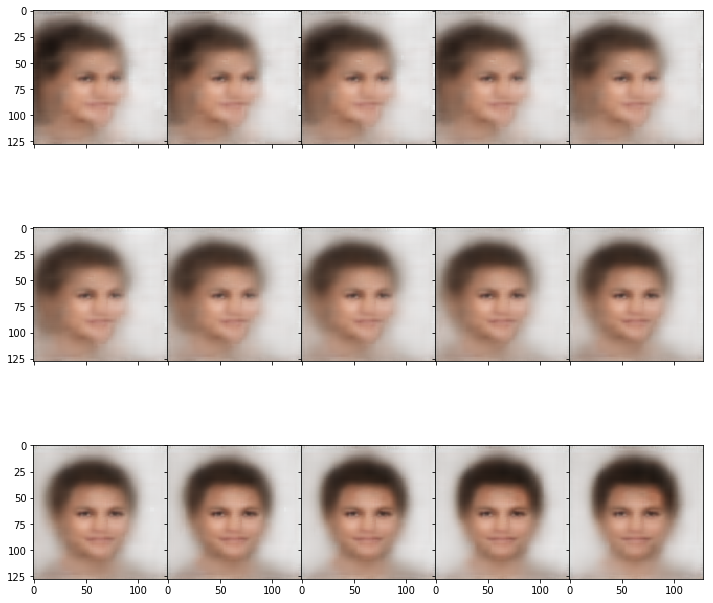

In [135]:
# plot merge from image 1 to image 2
R = 3
C = 5
RC = R*C
fig, ax = plt.subplots(R,C, figsize=(12,12), sharex=True, sharey=True)

count = 0
for r in range(R):
    for c in range(C):
        temp = zpred1+ count*(zpred2-zpred1)/RC
        ax[r,c].imshow(decoder.predict(temp).reshape(DIMS))
        count+=1
fig.subplots_adjust(hspace = 0., wspace = 0.)

**1.B.5.** Generate and visualise around 15 celebrity faces not in your training set.  How do the generated faces compare in quality to celebrity faces from the training samples?

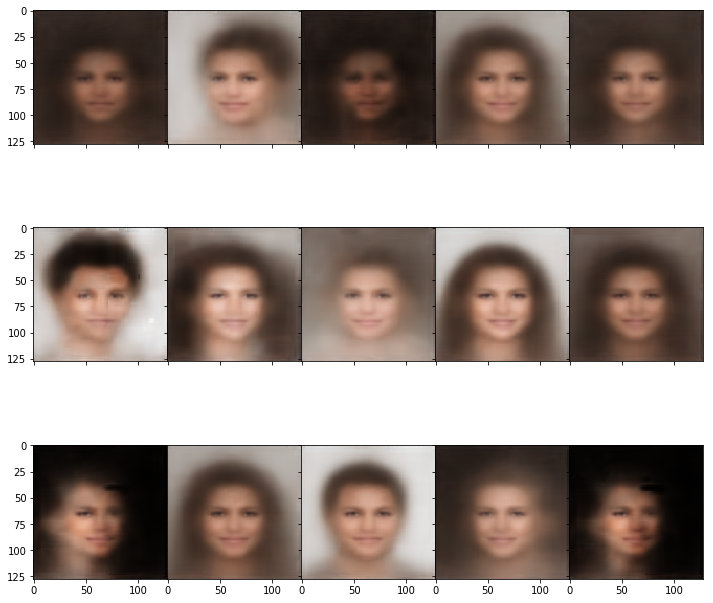

In [139]:
# plot non-training celebrities obtained from the latent space
R = 3
C = 5
RC = R*C
fig, ax = plt.subplots(R,C, figsize=(12,12), sharex=True, sharey=True)

count = 0
for r in range(R):
    for c in range(C):
        temp = np.random.normal(0.,1., (1,LATENT_DIMS))
        ax[r,c].imshow(decoder.predict(temp).reshape(DIMS))
        count+=1
fig.subplots_adjust(hspace = 0., wspace = 0.)

#### Please note that the VAE model can take a long time to train before you obtain decent results. Expect to train for more than 2-3hrs depending on the batch size

<div class="alert alert-block alert-info"> 

We see from the above that our VAE needs some tuning. Specifically, after experimentation with the architecture, changing the loss, and so on, I noticed that the issue seen above -- where I see the same sort of "central woman" in the output of the VAE -- lies in the number of latent dimensions. Simply put, a latent space of 6 dimensions does not work. Attempting to characterize more than 100,000 pixels through a mapping into 6 dimensions does not capture all the information we might need. We do see that the VAE captures some features -- e.g. the orientation and tilt of the head along with the accompanying background information – but the lack of dimensionality in the latent space reduces the central portion of the figure to essentially the mean face of all the celebrity photos, which is apparently a ghostly white woman.  Addressing this latter issue should improve results of the VAE i.e. improving reconstruction from an input image and construction of non-input images from the latent space, but the model undoubtedly would need to be highly tuned – e.g. increasing the batch size, increasing the number of convolution and deconvolutions filters, increasing the number of epochs, etc. Further, using all of the data should help – e.g. the original size – instead of having to resize it. Fine tuning should produce good quality images but achieving the level of quality of the training images will be difficult and take time.

</div>

### Part C: Building and Training a DCGAN Model [43 pts]

**1.C.1.** Create and compile a DCGAN model for the celebrity faces dataset.  Print summaries for the discriminator and generator models.

**1.C.2.** Train your model on the images in the celeba dataset.

**1.C.3.** Generate and visualise around 15 celebrity faces.  How do the generated faces compare in quality to celebrity faces from the training samples? How do they compare in quality to the faces generated via VAE?

#### Please note that the DCGAN model can take a long time to train before you obtain good results. Expect to train for more than 2 hrs depending on the batch size and number of epochs

# Solutions

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_33 (Conv2D)           (None, 32, 32, 32)        896       
_________________________________________________________________
leaky_re_lu_49 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_25 (Dropout)         (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 16, 16, 32)        9248      
_________________________________________________________________
leaky_re_lu_50 (LeakyReLU)   (None, 16, 16, 32)        0         
_________________________________________________________________
batch_normalization_57 (Batc (None, 16, 16, 32)        128       
_________________________________________________________________
dropout_26 (Dropout)         (None, 16, 16, 32)        0         
__________

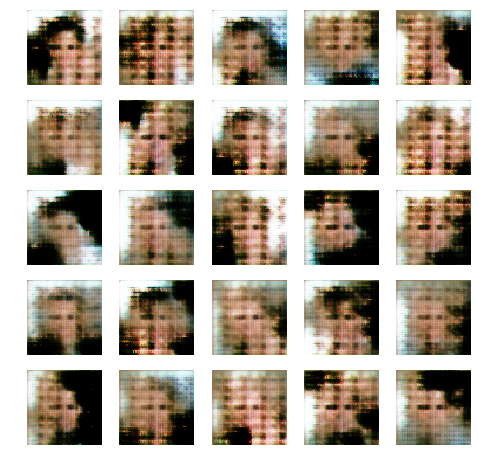

1
1 [D loss: 0.682201, acc.: 37.50%] [G loss: 3.033021]
(25, 64, 64, 3)


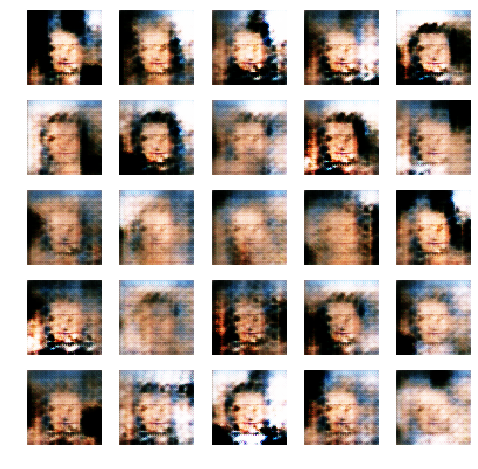

2
2 [D loss: 0.228594, acc.: 50.00%] [G loss: 4.556726]
(25, 64, 64, 3)


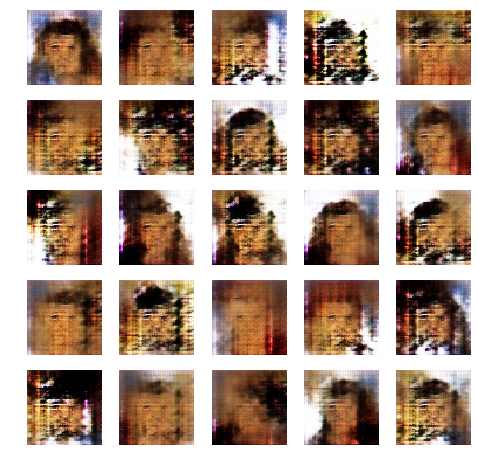

3
3 [D loss: 0.215414, acc.: 50.00%] [G loss: 2.363564]
(25, 64, 64, 3)


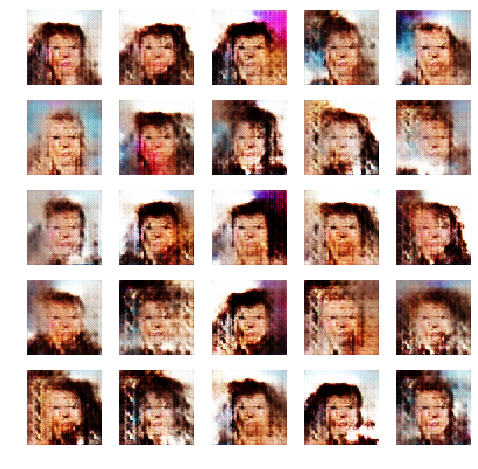

4
4 [D loss: 0.340846, acc.: 50.00%] [G loss: 3.098595]
(25, 64, 64, 3)


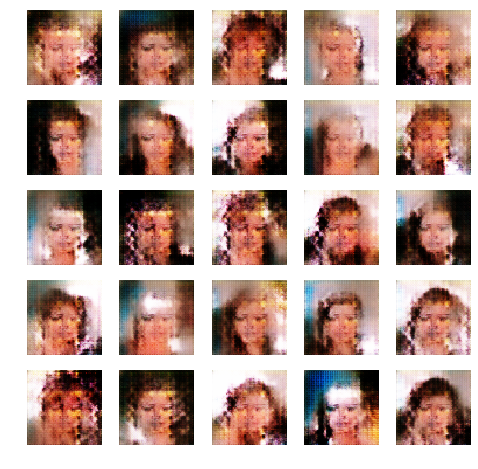

5
5 [D loss: 0.283913, acc.: 43.75%] [G loss: 3.453244]
(25, 64, 64, 3)


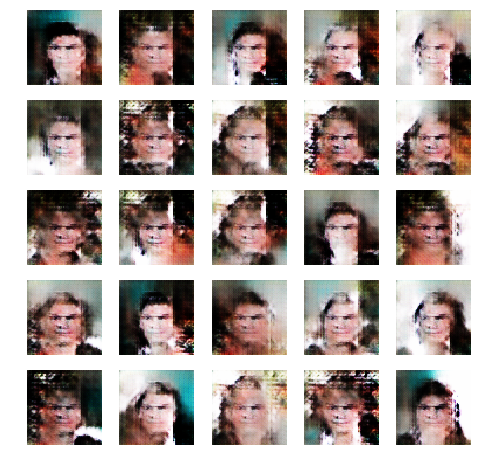

6
6 [D loss: 0.220832, acc.: 50.00%] [G loss: 1.327873]
(25, 64, 64, 3)


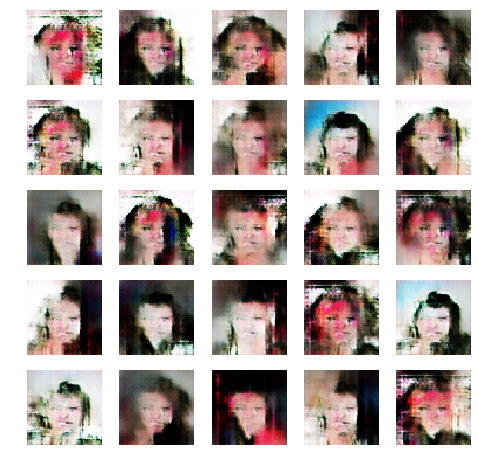

7
7 [D loss: 0.609516, acc.: 18.75%] [G loss: 2.642813]
(25, 64, 64, 3)


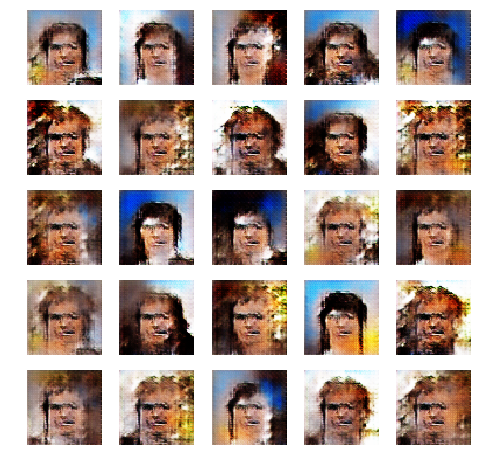

8
8 [D loss: 0.392863, acc.: 43.75%] [G loss: 3.000733]
(25, 64, 64, 3)


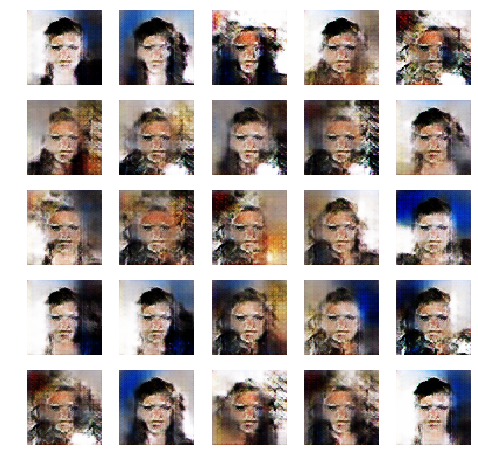

9
9 [D loss: 0.271314, acc.: 50.00%] [G loss: 2.913297]
(25, 64, 64, 3)


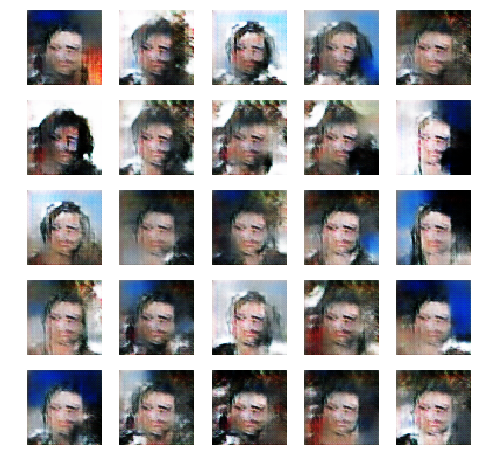

10
10 [D loss: 0.719188, acc.: 50.00%] [G loss: 2.976047]
(25, 64, 64, 3)


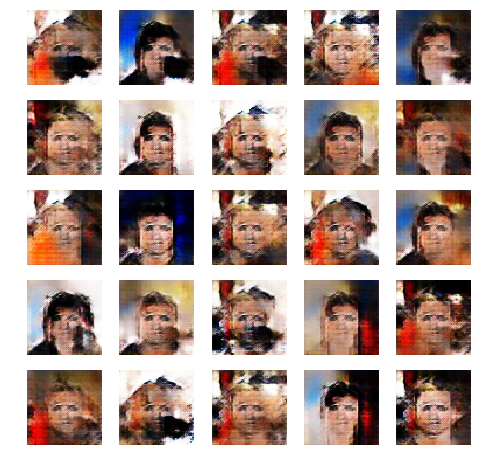

11
11 [D loss: 0.256477, acc.: 50.00%] [G loss: 1.789849]
(25, 64, 64, 3)


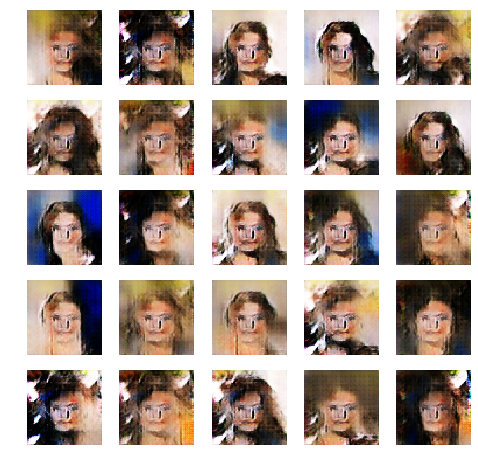

12
12 [D loss: 0.554290, acc.: 31.25%] [G loss: 1.226611]
(25, 64, 64, 3)


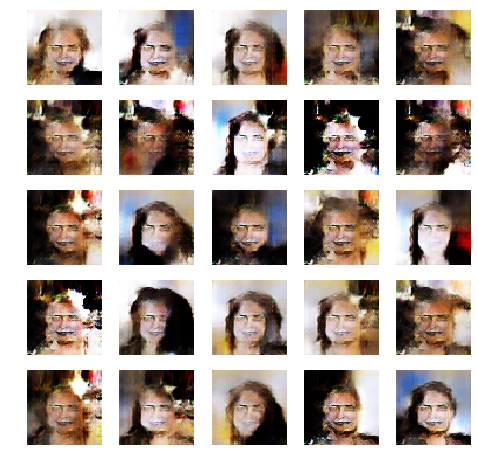

13
13 [D loss: 0.362275, acc.: 43.75%] [G loss: 1.940019]
(25, 64, 64, 3)


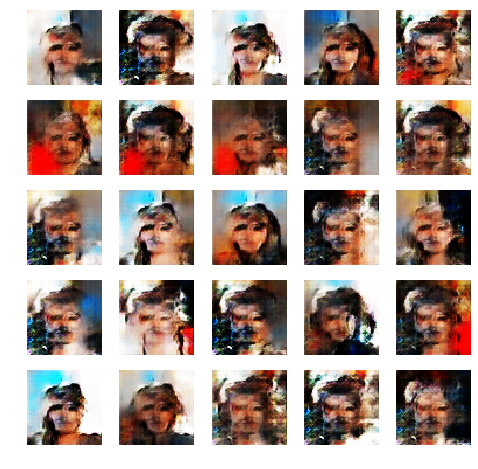

14
14 [D loss: 0.189307, acc.: 50.00%] [G loss: 5.214309]
(25, 64, 64, 3)


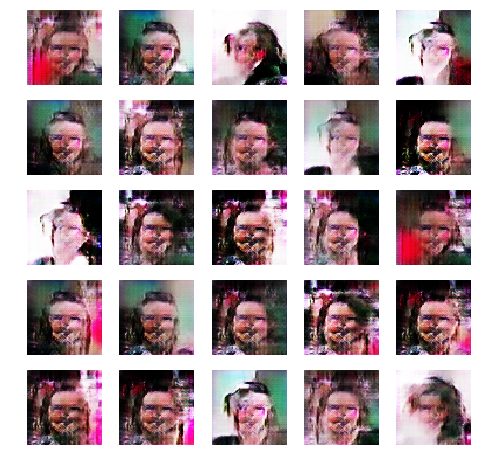

15
15 [D loss: 0.275869, acc.: 50.00%] [G loss: 2.980706]
(25, 64, 64, 3)


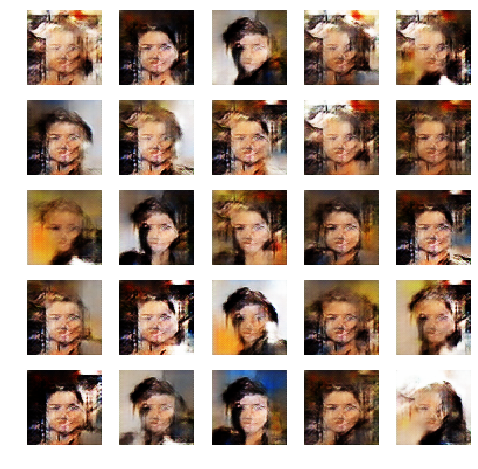

16
16 [D loss: 0.365687, acc.: 50.00%] [G loss: 1.797534]
(25, 64, 64, 3)


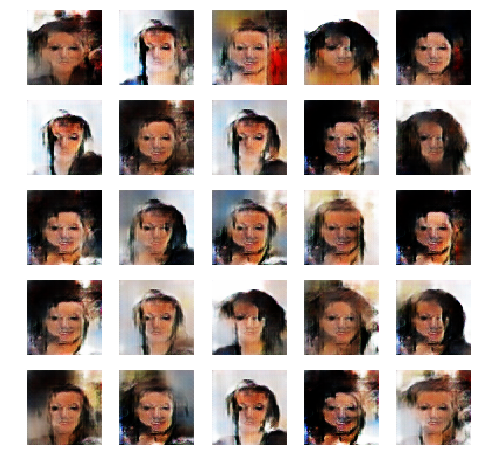

17
17 [D loss: 0.340350, acc.: 50.00%] [G loss: 2.838947]
(25, 64, 64, 3)


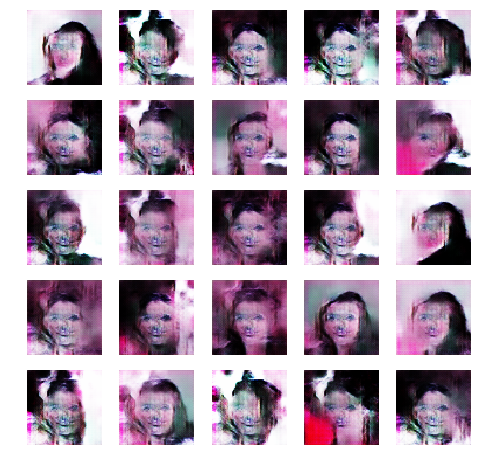

18
18 [D loss: 0.271448, acc.: 50.00%] [G loss: 1.250611]
(25, 64, 64, 3)


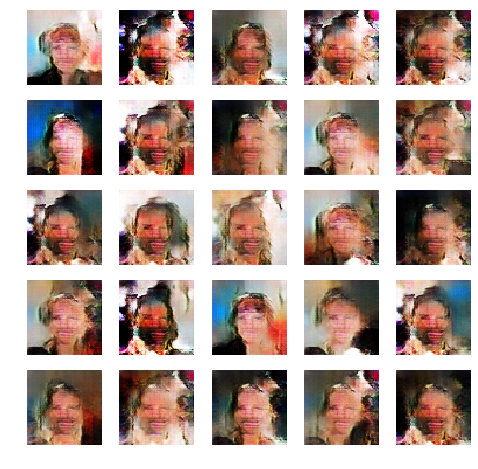

19
19 [D loss: 0.798631, acc.: 50.00%] [G loss: 2.460192]
(25, 64, 64, 3)


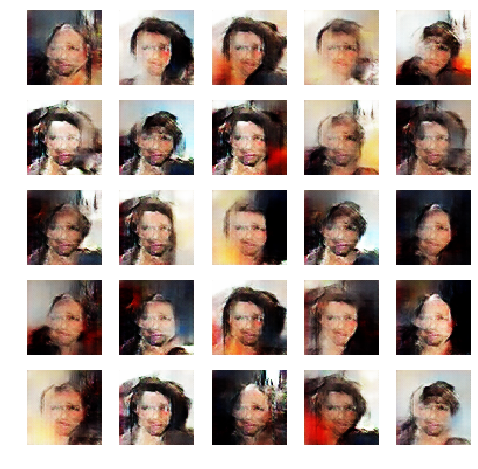

20
20 [D loss: 0.221615, acc.: 50.00%] [G loss: 2.984354]
(25, 64, 64, 3)


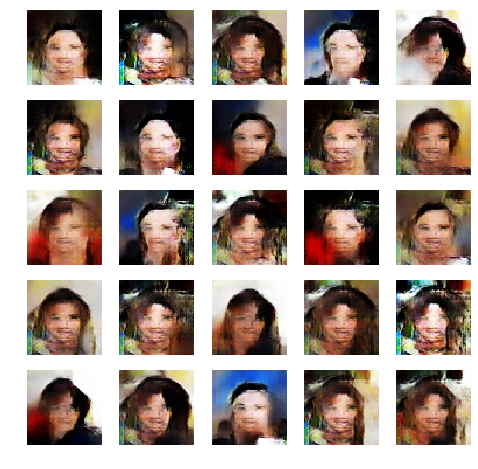

21
21 [D loss: 0.391751, acc.: 50.00%] [G loss: 2.254628]
(25, 64, 64, 3)


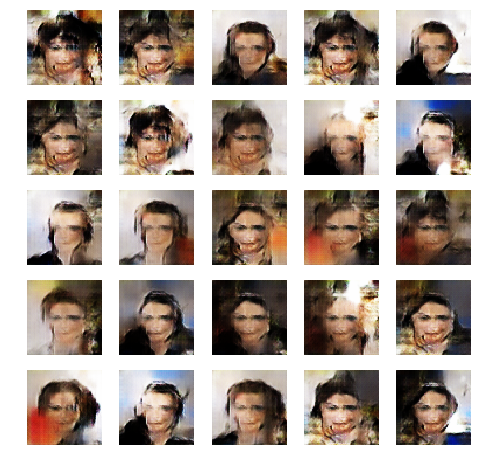

22
22 [D loss: 0.311966, acc.: 43.75%] [G loss: 2.894865]
(25, 64, 64, 3)


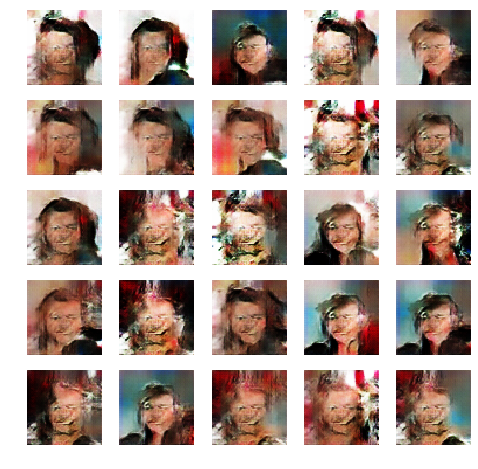

23
23 [D loss: 0.350761, acc.: 43.75%] [G loss: 1.391096]
(25, 64, 64, 3)


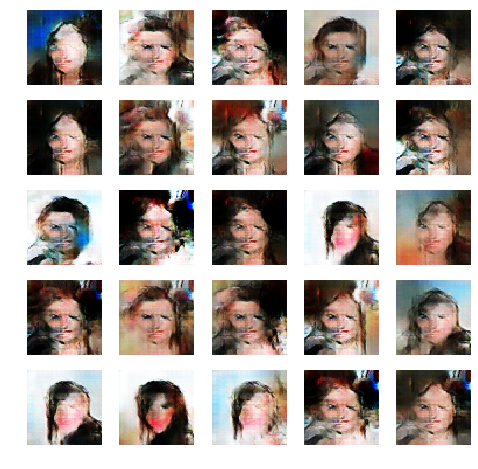

24
24 [D loss: 0.469407, acc.: 37.50%] [G loss: 1.513960]
(25, 64, 64, 3)


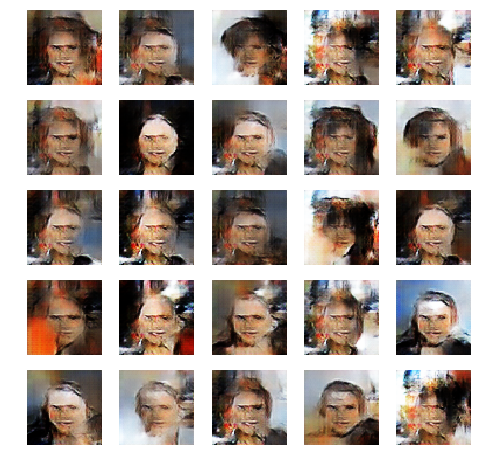

25
25 [D loss: 0.212822, acc.: 50.00%] [G loss: 2.812542]
(25, 64, 64, 3)


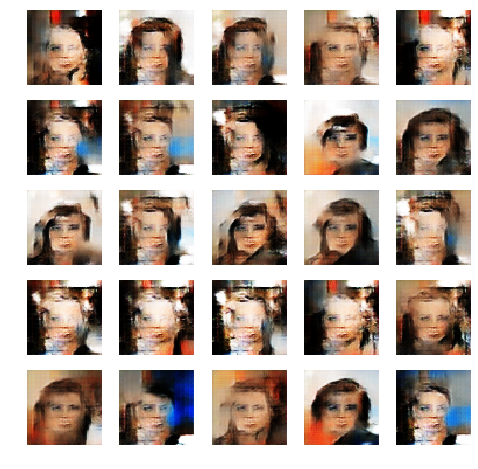

26
26 [D loss: 0.363905, acc.: 43.75%] [G loss: 2.259497]
(25, 64, 64, 3)


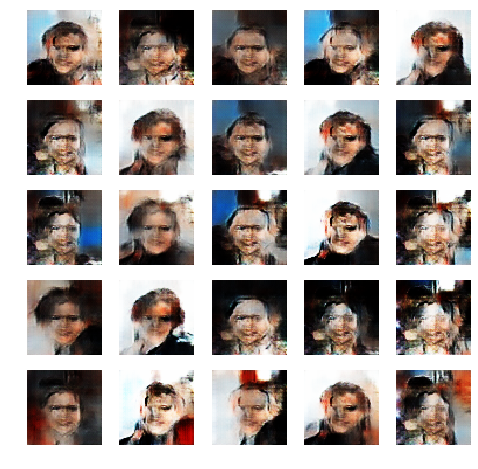

27
27 [D loss: 0.323757, acc.: 50.00%] [G loss: 2.742429]
(25, 64, 64, 3)


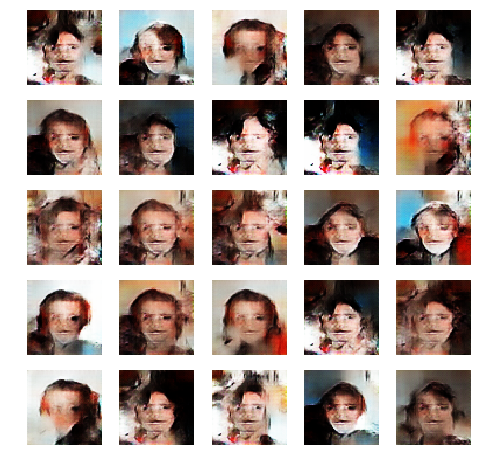

28
28 [D loss: 0.341819, acc.: 50.00%] [G loss: 3.162145]
(25, 64, 64, 3)


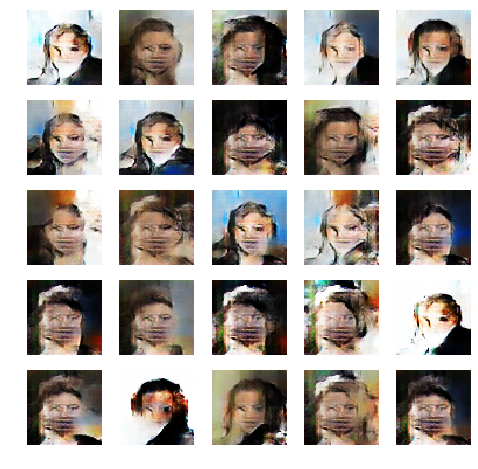

29
29 [D loss: 0.199634, acc.: 50.00%] [G loss: 3.865703]
(25, 64, 64, 3)


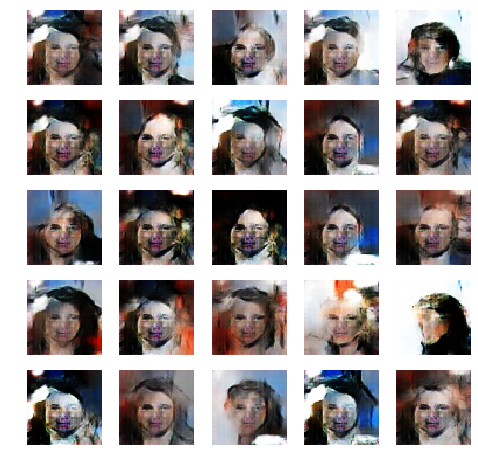

In [146]:
# dcgan model
class DCGAN():
    
    # initialization
    def __init__(self):
        
        # label IDS
        self.list_IDs = list_IDs
        
        # image shape
        self.dims = (64,64,3)
        
        # laten dim
        self.latent_dim = 100

        # build and compile  discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer='adam',
            metrics=['accuracy'])

        # build generator
        self.generator = self.build_generator()

        # generator takes noise as input and produces images
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # combined model
        # -- we only train generator
        self.discriminator.trainable = False

        # discriminator takes generated images as input and determines
        # if real or fake
        real = self.discriminator(img)

        # combined model
        self.combined = Model(z, real)
        self.combined.compile(loss='binary_crossentropy', optimizer='adam')

    def build_generator(self):
        
        # generator architecture
        model = Sequential()

        model.add(Dense(4*4*128, input_shape=(self.latent_dim,), 
                       kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Reshape((4,4,128)))

        model.add(Conv2DTranspose(32, kernel_size=5, strides=2, padding='same',
                                 kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Conv2DTranspose(32, kernel_size=5, strides=2, padding='same',
                                 kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Conv2DTranspose(32, kernel_size=5, strides=2, padding='same',
                                 kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))

        model.add(Conv2DTranspose(3, kernel_size=5, strides=2, padding='same',
                                 kernel_initializer='glorot_normal',
                                  activation='tanh'))
        
        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):
        # discriminator architecture 
        
        model = Sequential()

        model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=self.dims, padding="same", 
                        kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))

        model.add(Conv2D(32, kernel_size=3, strides=2, padding="same",
                        kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dropout(0.25))

        model.add(Conv2D(16, kernel_size=3, strides=2, padding="same",
                        kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dropout(0.25))

        model.add(Conv2D(16, kernel_size=3, strides=2, padding="same",
                        kernel_initializer='glorot_normal'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dropout(0.25))

        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.dims)
        real = model(img)

        return Model(img, real)

    def train(self, epochs, batch_size=8, save_interval=50):

        # loop over epochs
        for epoch in range(epochs):
            print(epoch)

            ### train discriminator
            
            # data
            idx = np.random.permutation(self.list_IDs)[:30000]
            N = idx.shape[0]
            
            # data indeces
            inds = list(range(0,N+batch_size, batch_size))+[N]
            
            # loop over batches
            for i,ind in enumerate(inds):
                
                # conditional handling
                if ind != N:
                    temp_idx = idx[inds[i]:inds[i+1]]
                    
                    n = temp_idx.shape[0]
                    
                    if n != batch_size:
                        continue
                    
                    # grab batch data
                    X_train = np.zeros((n,)+self.dims)
                    for i in range(n):
                        img = img_to_array(load_img(os.path.join(DATA_DIR,temp_idx[i])))/127.5 - 1.
                        img = cv2.resize(img, self.dims[:-1])
                        X_train[i,...] = img

                    # real and fake labels
                    real = np.ones((n, 1))*0.9
                    fake = np.zeros((n, 1))

                    # sample noise and generate a batch of new, fake images
                    noise = np.random.normal(0, 1, (n, self.latent_dim))
                    gen_imgs = self.generator.predict(noise)
                    #print(gen_imgs.shape)

                    # train discriminator 
                    # -- real == 1
                    # -- fake == 0
                    self.discriminator.trainable = True
                    d_loss_real = self.discriminator.train_on_batch(X_train, real)
                    d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
                    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
                    self.discriminator.trainable = False

                    #### train generator
                    g_loss = self.combined.train_on_batch(noise, real)

            # progress output
            print("Epoch: {} - [D loss: {:.4f}, acc.: {:.2f}%] [G loss: {:.4f}]".format(epoch, d_loss[0], 100*d_loss[1], g_loss))

            # plot gen. images at intervals
            if epoch % save_interval == 0:
                self.show_imgs(epoch)

    # plot, save gen. images
    def show_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # rescale images to 0-1
        gen_images = np.array(gen_imgs)
        gen_imgs = (0.5*gen_imgs) + 0.5
        print(gen_imgs.shape)

        fig, axs = plt.subplots(r, c, figsize=(8,8))
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt,...])
                axs[i,j].axis('off')
                cnt += 1
        plt.show()

# instantiate and train
dcgan = DCGAN()
dcgan.train(epochs=30, batch_size=8, save_interval=1)

0
0 [D loss: 0.475753, acc.: 50.00%] [G loss: 2.841557]
(25, 64, 64, 3)


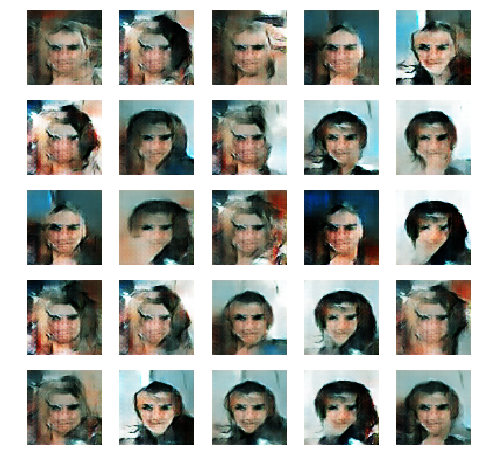

1
1 [D loss: 0.457700, acc.: 50.00%] [G loss: 1.162718]
(25, 64, 64, 3)


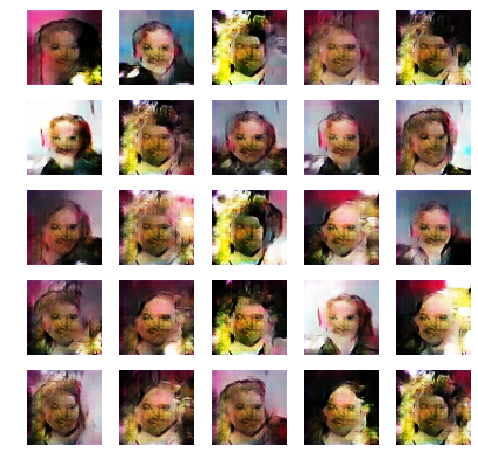

2
2 [D loss: 0.917550, acc.: 50.00%] [G loss: 1.117946]
(25, 64, 64, 3)


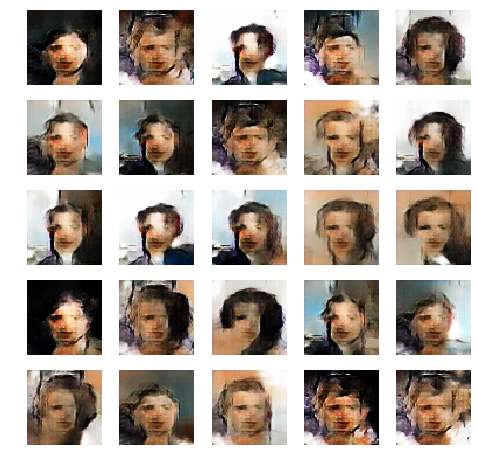

3
3 [D loss: 0.736202, acc.: 37.50%] [G loss: 1.160014]
(25, 64, 64, 3)


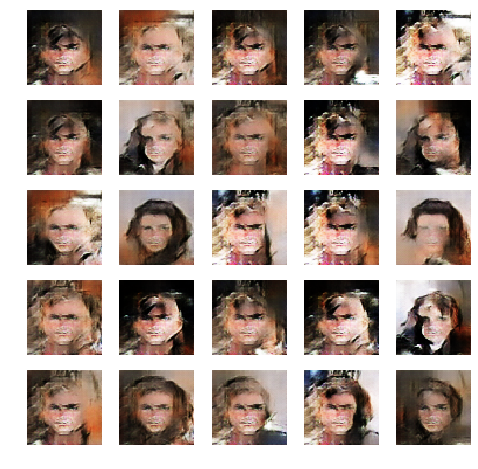

4
4 [D loss: 0.389796, acc.: 43.75%] [G loss: 3.098069]
(25, 64, 64, 3)


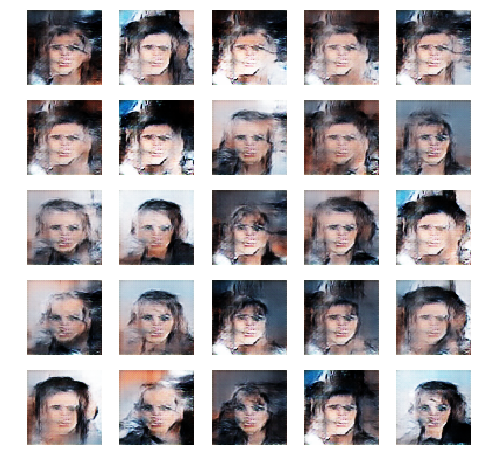

5
5 [D loss: 0.403622, acc.: 50.00%] [G loss: 1.287191]
(25, 64, 64, 3)


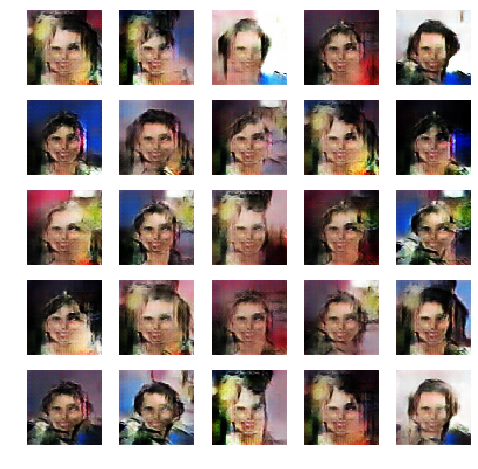

6
6 [D loss: 0.224470, acc.: 50.00%] [G loss: 2.710575]
(25, 64, 64, 3)


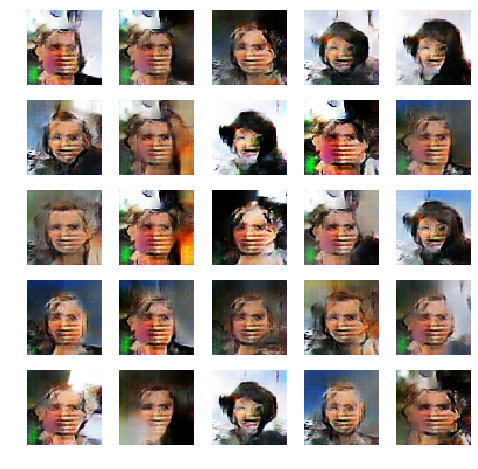

7
7 [D loss: 0.814275, acc.: 50.00%] [G loss: 3.325613]
(25, 64, 64, 3)


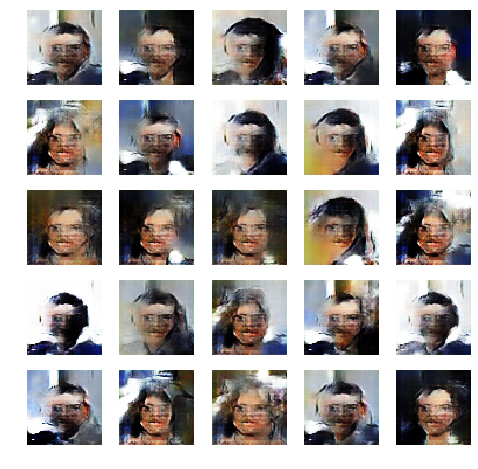

8
8 [D loss: 0.449339, acc.: 37.50%] [G loss: 1.221897]
(25, 64, 64, 3)


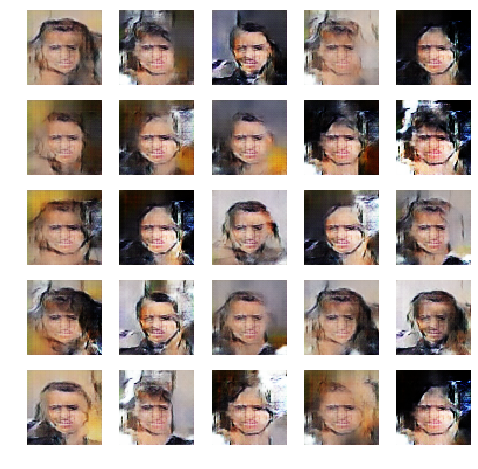

9


In [ ]:
# continue training 
dcgan.train(epochs=10, batch_size=8, save_interval=1)

In [ ]:
# continue training 
dcgan.train(epochs=50, batch_size=8, save_interval=1)

<div class="alert alert-block alert-info"> 

From the above, we see that the DCGAN outperforms our VAE model, but we also see that the quality of the images still does not compare to the quality of the training data -- at the current point of training in the data. This makes sense as GANs take considerably long amounts of time to train to a point where the model can produce images indistinguishable from the real images. 

</div>

## Question 2: VAE-GANIME [3 pts - ALMOST OPTIONAL] 

Wikipedia describes [Anime]() as follows:

Anime is hand-drawn and computer animation originating from or associated with Japan.  

The word anime is the Japanese term for animation, which means all forms of animated media. Outside Japan, anime refers specifically to animation from Japan or as a Japanese-disseminated animation style often characterized by colorful graphics, vibrant characters and fantastical themes. The culturally abstract approach to the word's meaning may open up the possibility of anime produced in countries other than Japan For simplicity, many Westerners strictly view anime as a Japanese animation product. Some scholars suggest defining anime as specifically or quintessentially Japanese may be related to a new form of Orientalism

We've provided you a dataset of anime faces and we want you to create a model to generate faces in the same style using a special form of GAN, a VAE-GAN.  The term VAE-GAN was first used by Larsen et. al in their paper [“Autoencoding beyond pixels using a learned similarity metric”](https://arxiv.org/abs/1512.09300).  VAE-GAN models differentiate themselves from GANs in that their generators are variation autoencoders.

![](https://cdn-images-1.medium.com/max/800/0*KEmfTtghsCDu6UTb.png)

### Part A: Preparing the Data 

**2.A.1.** Download the dataset from [Anime-Face Dataset](https://s3.amazonaws.com/gec-harvard-dl2-hw2-data/datasets/anime-faces.zip). It contains over 20K anime faces in the form of 64x64 images.  Use them to create your anime face dataset.  Again, you may find it to your advantage to create a [Keras Custom Data Generator](https://techblog.appnexus.com/a-keras-multithreaded-dataframe-generator-for-millions-of-image-files-84d3027f6f43).

### Part B: Building and Training a DCGAN 

**2.B.1.** Create and compile a DCGAN model for the anime faces dataset.  Print summaries for the generator and discriminator models

**2.B.2.** Train your model on the images in the anime faces dataset.

**2.B.3.** Generate and visualise around 15 anime faces not in your training set.  How do the generated faces compare in quality to anime faces from the training samples?

### Part C: Building and Training a VAE-GAN 

**2.C.1.** Create and compile a VAE-GAN model for the anime faces dataset.  Print summaries for the encoder, decoder and discriminator models

**2.C.2.** Train your model on the images in the anime faces dataset.

**2.C.3.** Generate and visualise around 15 anime faces not in your training set.  How do the generated faces compare in quality to anime faces from the training samples? How do they compare to the faces from the traditional GAN?

#### Please note that the DCGAN model can take a long time to train before you obtain good results. Expect to train for more than 2 hrs depending on the batch size and number of epochs